In [1]:
from ultralytics import settings

In [2]:
print(settings)

{'settings_version': '0.0.4', 'datasets_dir': 'C:\\myproject\\Dataset', 'weights_dir': 'weights', 'runs_dir': 'runs', 'uuid': 'c4e4b05d0288746ef02f3a2ce47bef266a74be6a732f97dcece29a8f7956eacb', 'sync': True, 'api_key': '', 'openai_api_key': '', 'clearml': True, 'comet': True, 'dvc': True, 'hub': True, 'mlflow': True, 'neptune': True, 'raytune': True, 'tensorboard': True, 'wandb': True}


In [3]:
from ultralytics import YOLO

In [4]:
import IPython.display

In [5]:
import tqdm.notebook

In [6]:
import ast

In [7]:
import os.path

In [8]:
import random

In [9]:
import numpy as np

In [10]:
import PIL 

In [11]:
from PIL import Image, ImageDraw

In [12]:
import pandas as pd

In [13]:
from pathlib import Path

In [14]:
import glob

In [15]:
import matplotlib.pyplot as plt 

In [16]:
import seaborn as sns

In [17]:
%matplotlib inline

In [18]:
import plotly.express as px

In [19]:
import IPython.display

In [20]:
image_list = glob.glob("Dataset/train/images/*.jpg")

In [21]:
print(f"Number of images: {len(image_list)}")

Number of images: 7463


(2048, 2048)


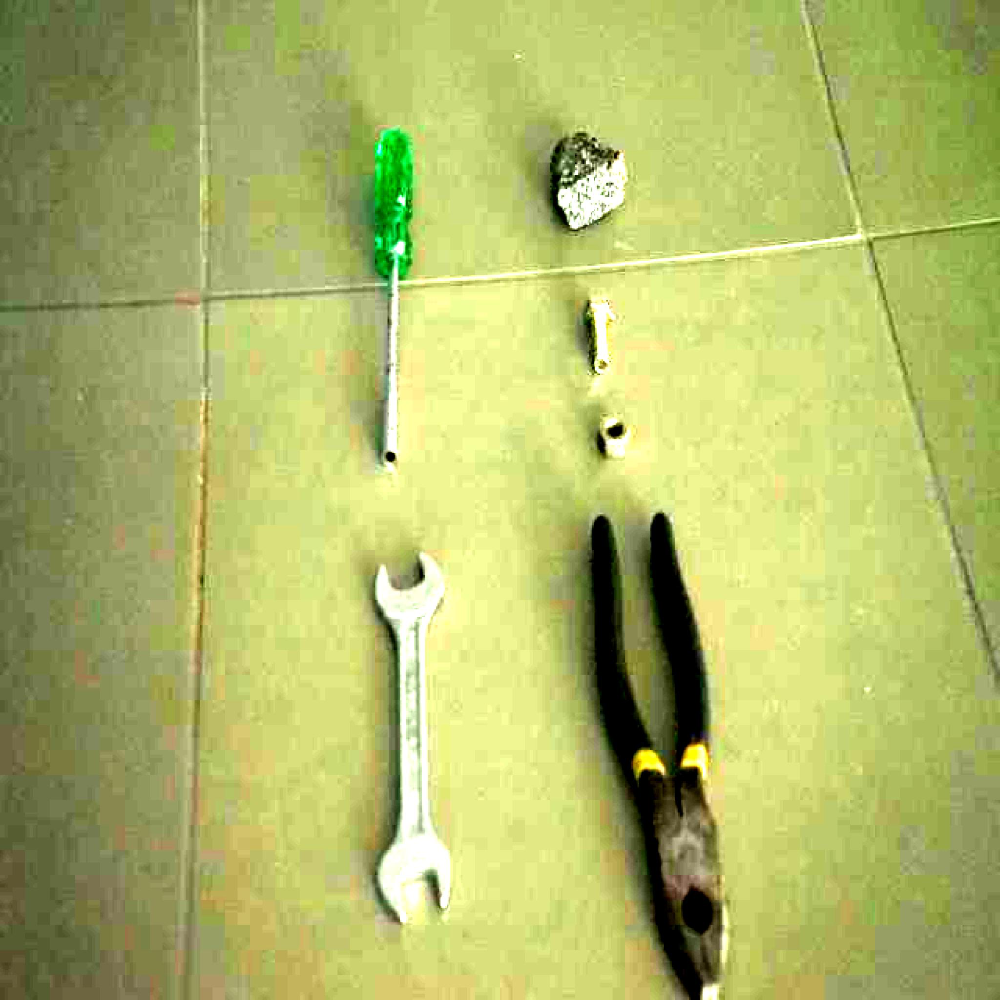

In [22]:
pickone = random.choice(image_list)
img = Image.open(pickone)
print(img.size)
display(img)

In [23]:
IMAGE_HEIGHT, IMAGE_WIDTH = img.size
num_channels = len(img.mode)

In [24]:
def f(x): 
    return ast.literal_eval(x.rstrip('\r\n'))


In [25]:
can_train = False

In [26]:
if can_train:
    model = YOLO('yolov8n.pt')
    results = model.train(data='Dataset/data.yaml', epochs=3)
else:
    model = YOLO("Roboflow-MB-DS-YOLO.pt")

In [27]:
val_results = model.val()

Ultralytics YOLOv8.2.5  Python-3.9.12 torch-2.3.0+cpu CPU (AMD Ryzen 5 5500U with Radeon Graphics)
Model summary (fused): 168 layers, 3006818 parameters, 0 gradients, 8.1 GFLOPs


val: Scanning C:\myproject\Dataset\valid\labels.cache... 740 images, 0 backgrounds, 0 corrupt: 100%|██████████| 740/740
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 47/47 [02:05


                   all        740       4440      0.996      0.995      0.994      0.618
                  bolt        740        740      0.993       0.98      0.994      0.509
                   nut        740        740      0.988      0.995      0.992      0.458
                 plier        740        740      0.999          1      0.995      0.743
          screw driver        740        740      0.998          1      0.995      0.655
                 stone        740        740          1      0.996      0.995      0.635
                wrench        740        740      0.999          1      0.995      0.707
Speed: 2.5ms preprocess, 112.4ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to runs\detect\val7


In [28]:
val_dir_list = sorted(glob.glob("runs/detect/train42*"), reverse=True)

In [29]:
val_dir = val_dir_list[0]

In [30]:
val_dir

'runs/detect\\train42'

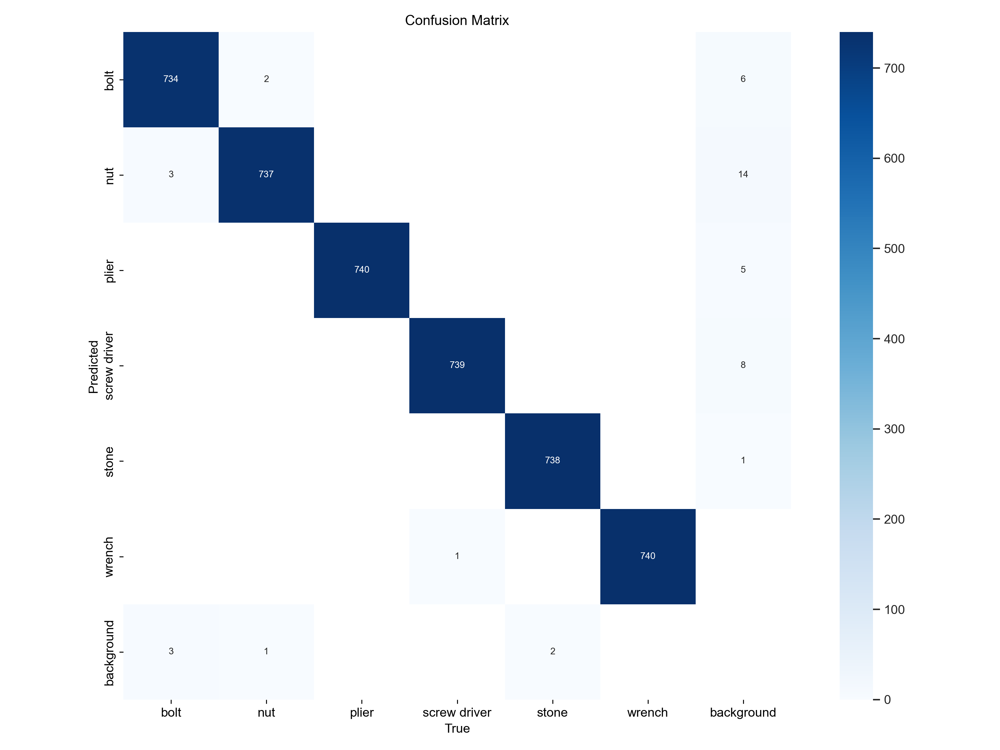

In [31]:
IPython.display.Image(filename=f'{val_dir}/confusion_matrix.png')

Precision Curve


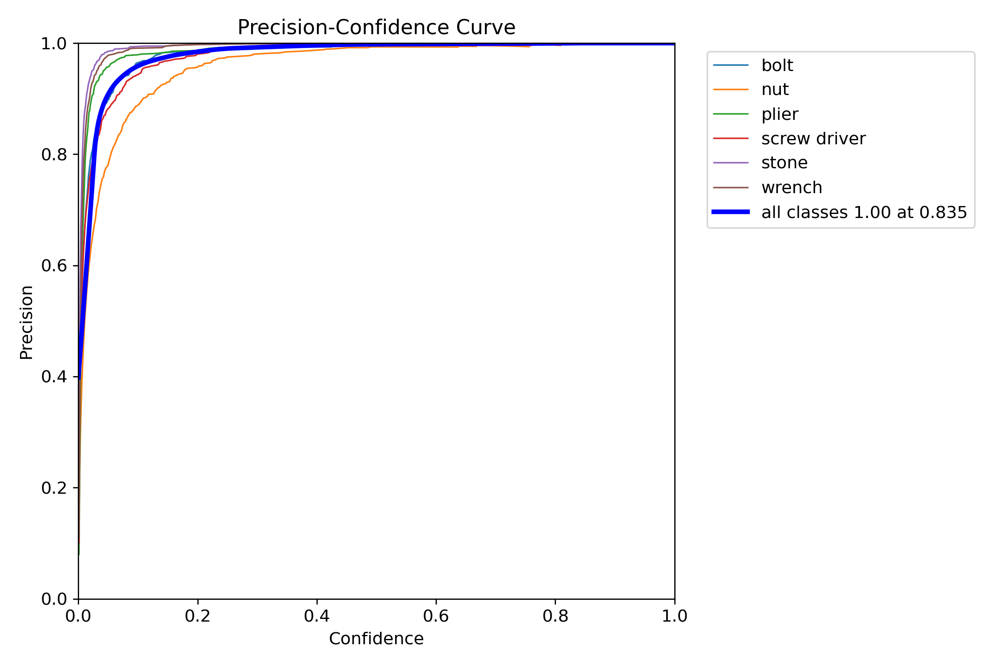

In [32]:
print('Precision Curve')
IPython.display.Image(filename=f'{val_dir}/p_curve.png')

Recall Curve


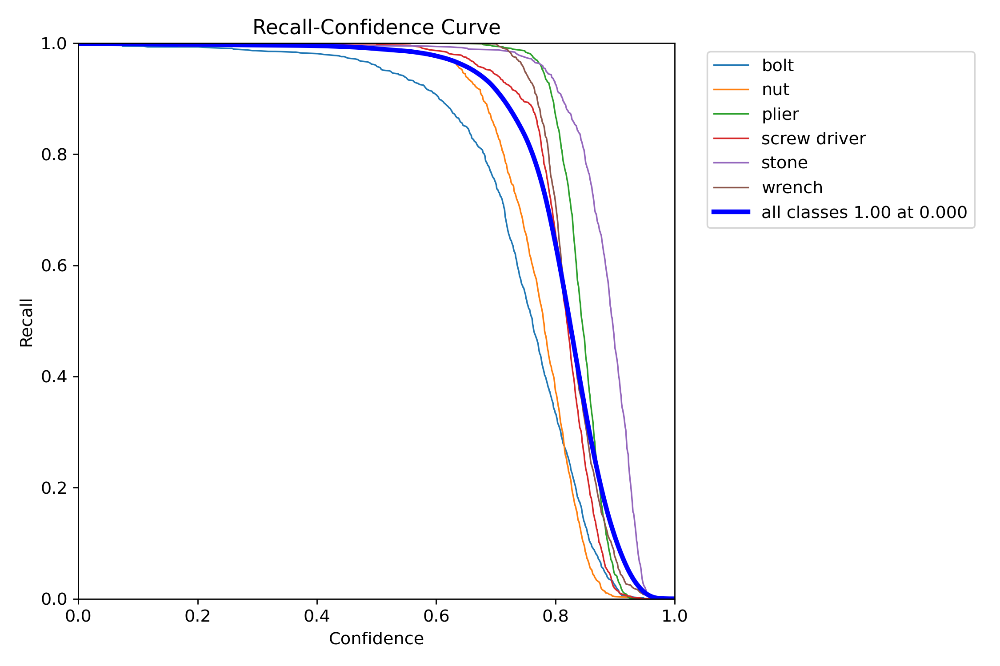

In [33]:
print('Recall Curve')
IPython.display.Image(filename=f'{val_dir}/R_curve.png')

F1-Score Curve


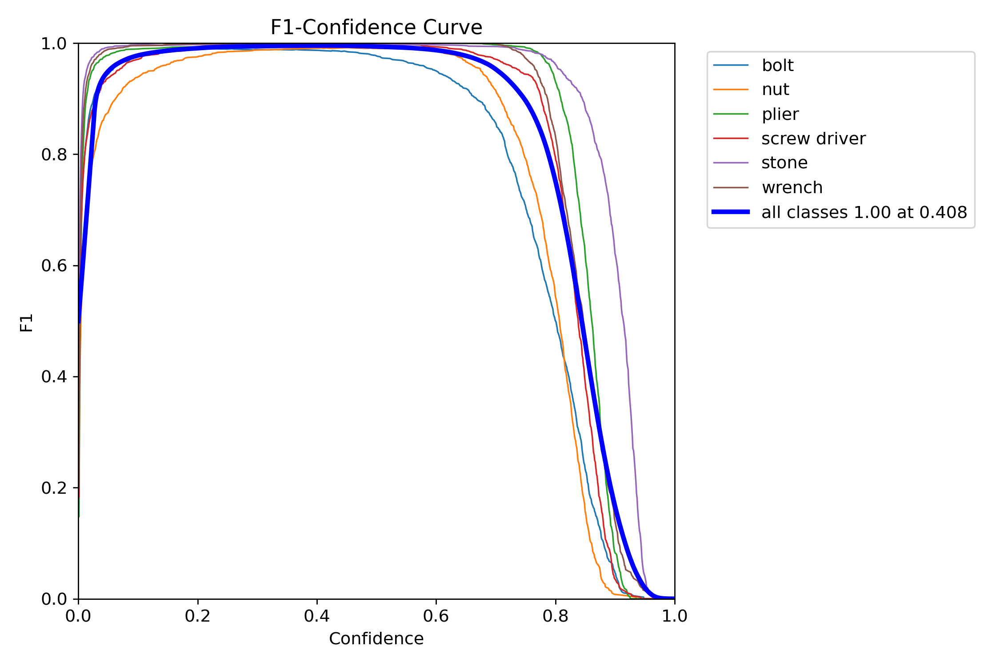

In [34]:
print('F1-Score Curve')
IPython.display.Image(filename=f'{val_dir}/f1_curve.png')

Precision-Recall Curve


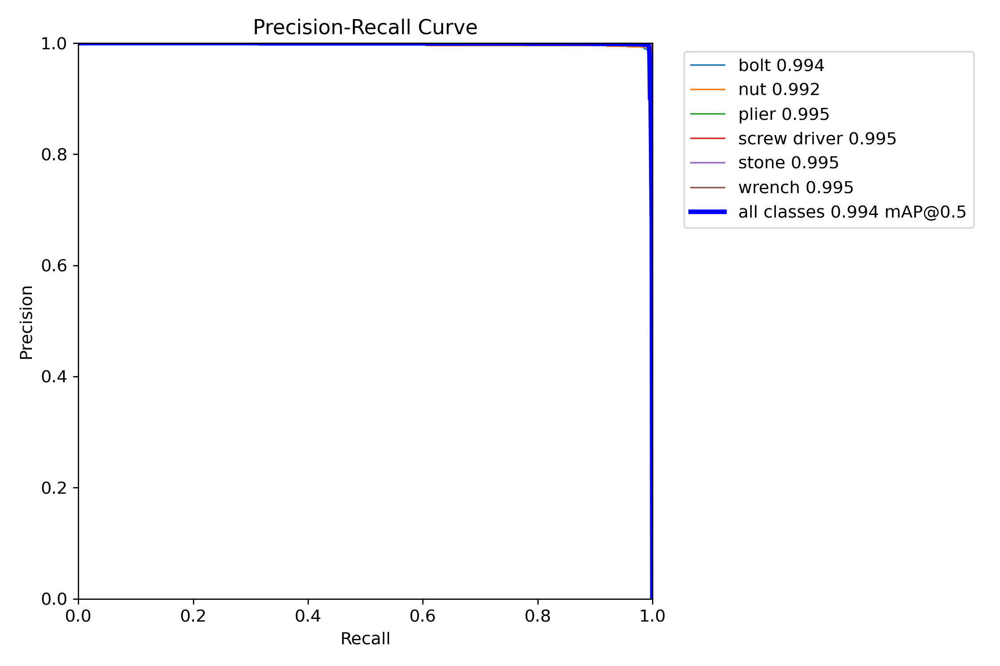

In [35]:
print('Precision-Recall Curve')
IPython.display.Image(filename=f'{val_dir}/pr_curve.png')

In [36]:
val_dir

'runs/detect\\train42'

Validation Prediction
Prediction Image


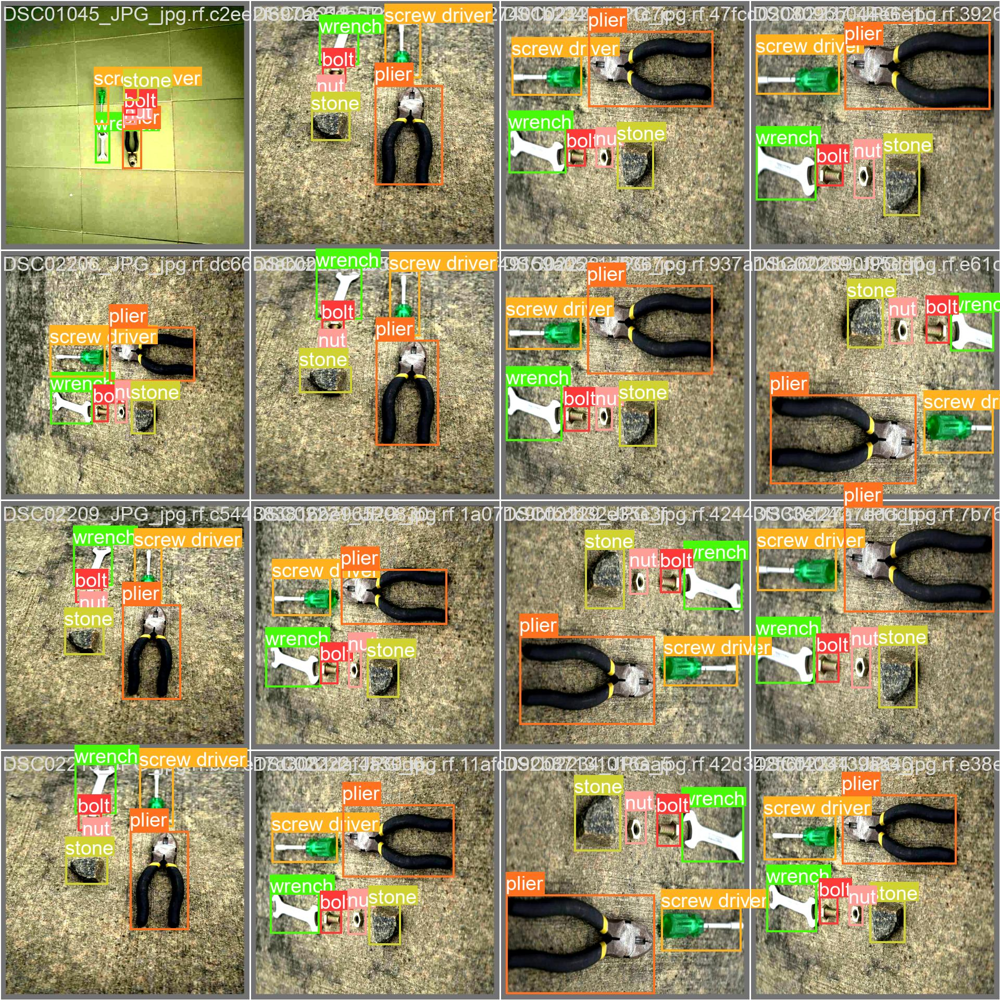

Prediction Image


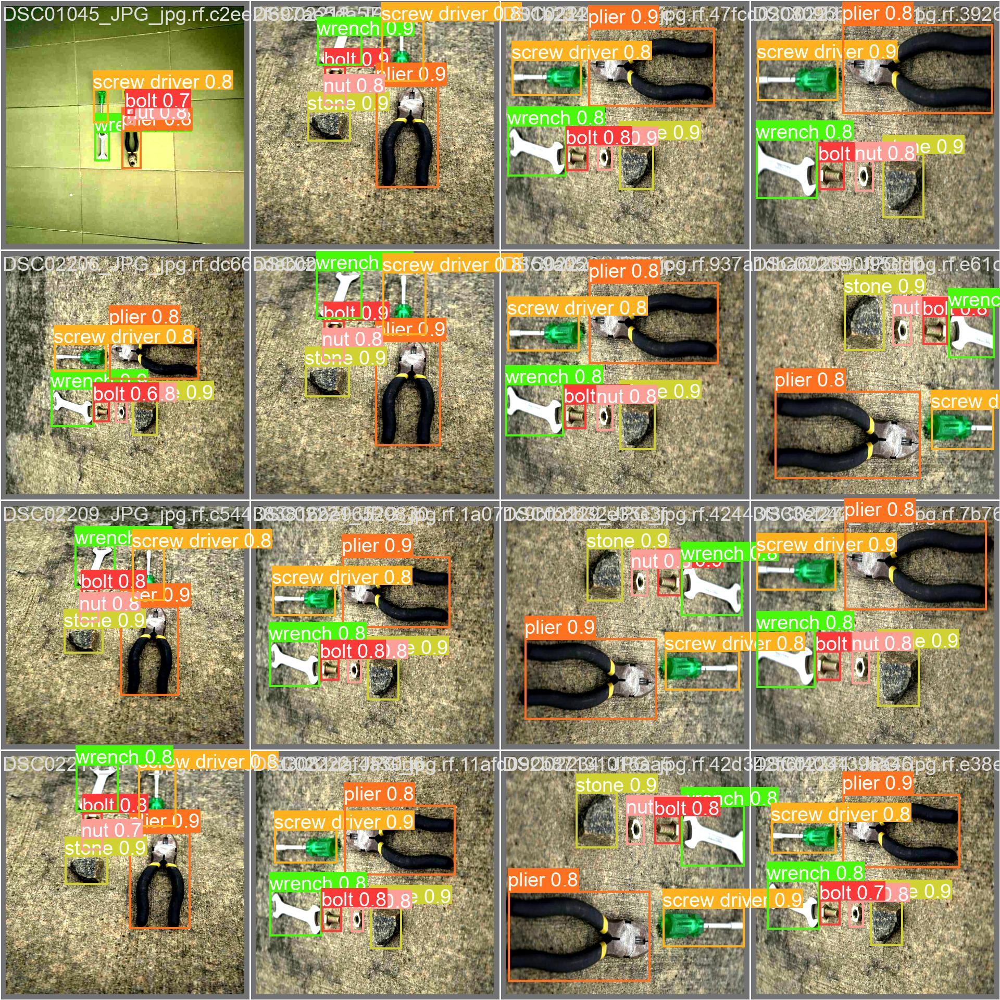

Prediction Image


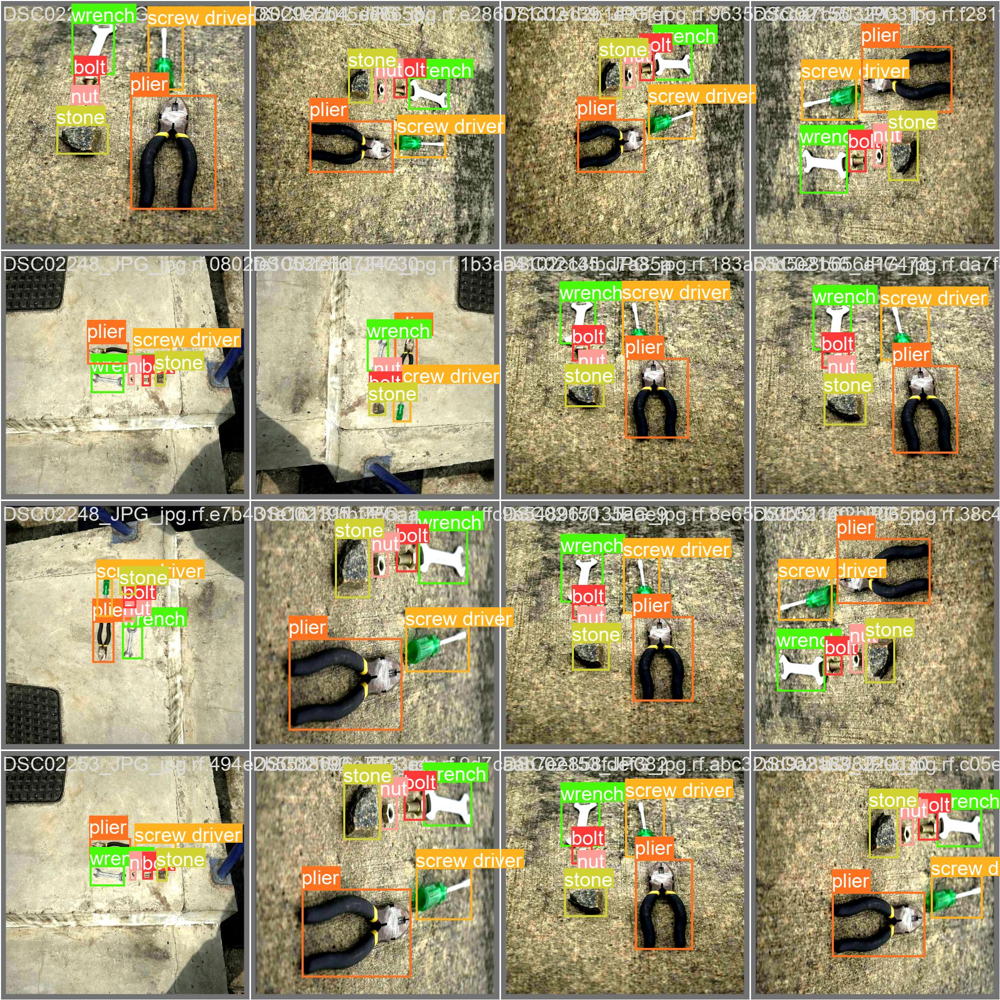

Prediction Image


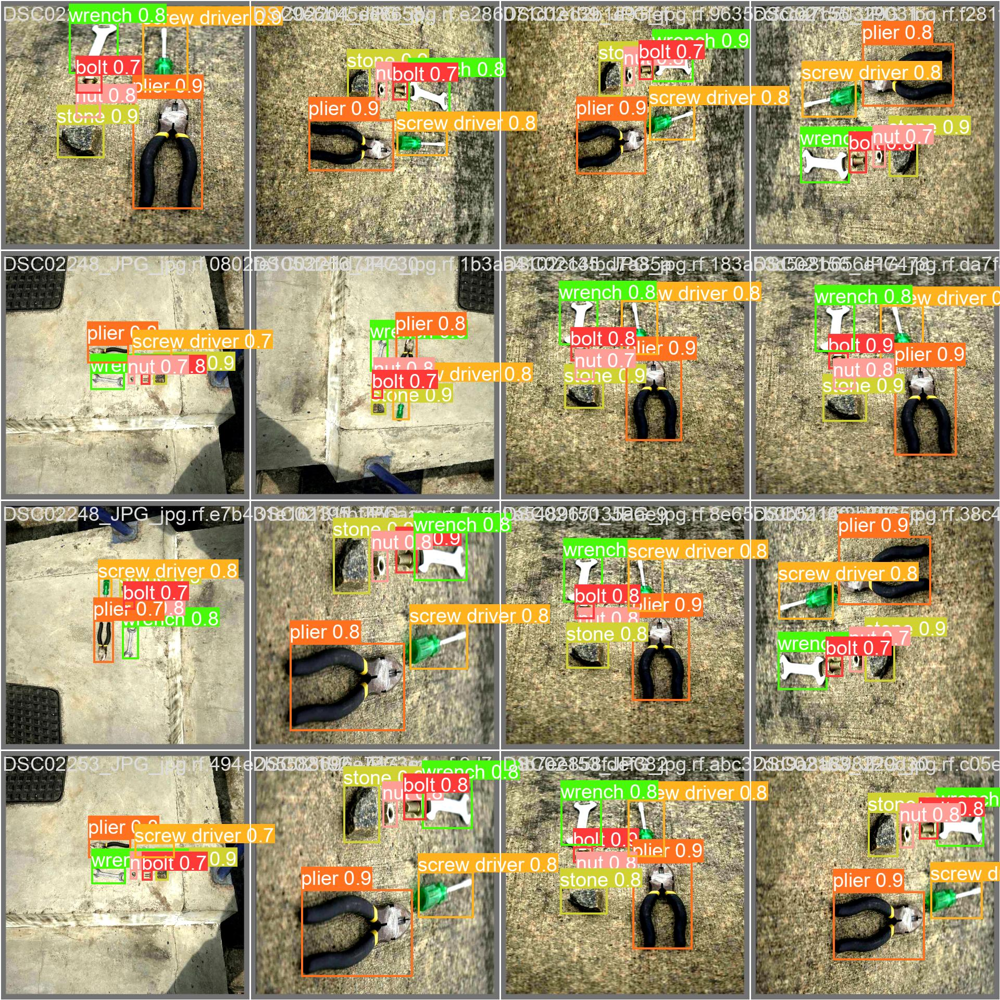

Prediction Image


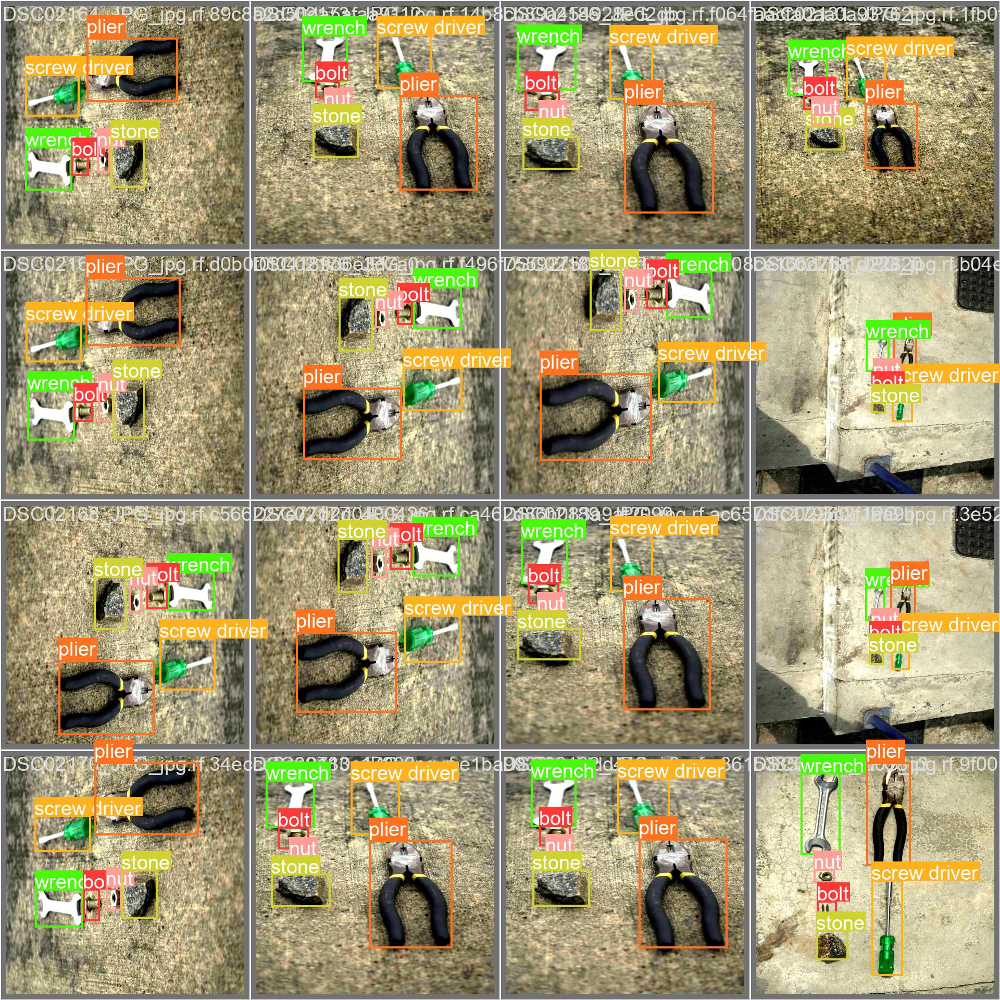

Prediction Image


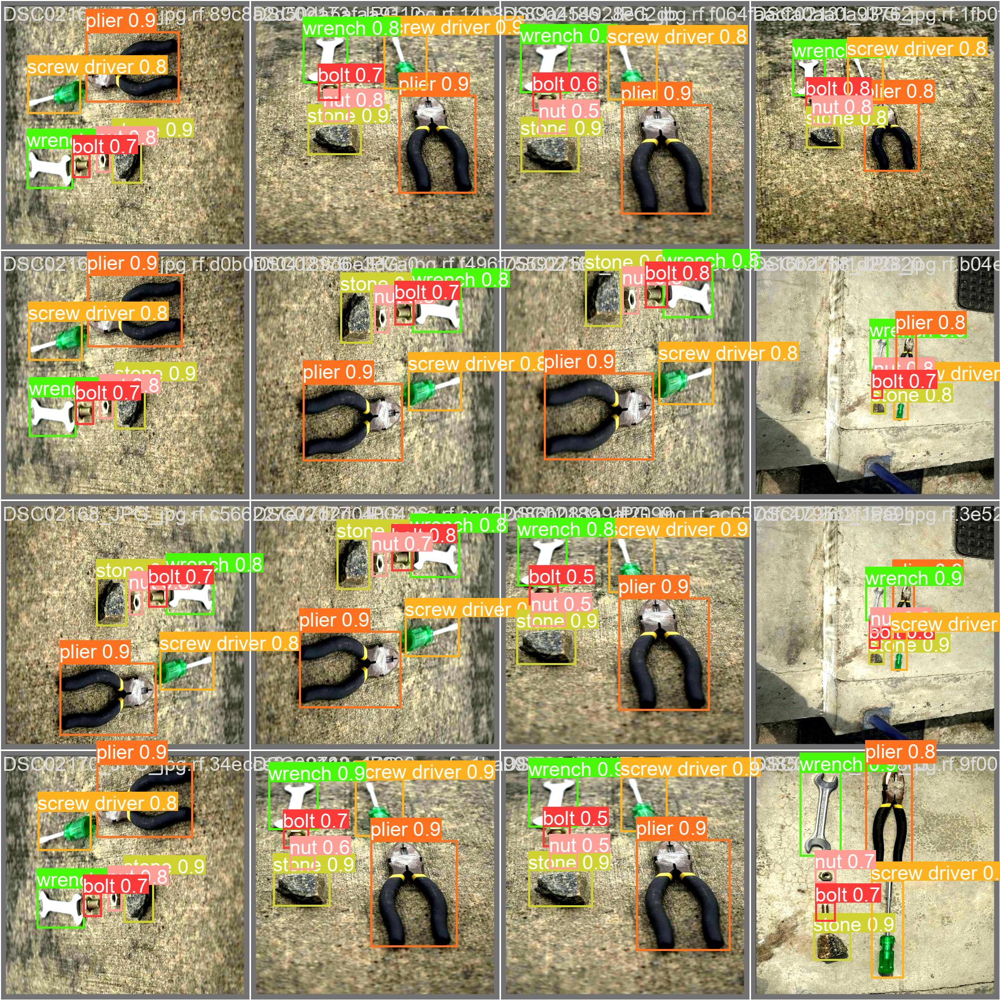

In [37]:
print('Validation Prediction')
val_predict_list = sorted(glob.glob(f"{val_dir}/val_*.jpg"))
for val_predict in val_predict_list:
    print("Prediction Image")
    IPython.display.display(IPython.display.Image(filename=f'{val_predict}'))

In [38]:
val_predict_list

['runs/detect\\train42\\val_batch0_labels.jpg',
 'runs/detect\\train42\\val_batch0_pred.jpg',
 'runs/detect\\train42\\val_batch1_labels.jpg',
 'runs/detect\\train42\\val_batch1_pred.jpg',
 'runs/detect\\train42\\val_batch2_labels.jpg',
 'runs/detect\\train42\\val_batch2_pred.jpg']

In [39]:
results = model('Dataset/test/images/DSC01055_JPG_jpg.rf.f290cab01539e1ad4aaa6b56e1944b23.jpg')


image 1/1 C:\myproject\Dataset\test\images\DSC01055_JPG_jpg.rf.f290cab01539e1ad4aaa6b56e1944b23.jpg: 640x640 1 bolt, 1 nut, 1 plier, 1 screw driver, 1 stone, 1 wrench, 109.7ms
Speed: 0.0ms preprocess, 109.7ms inference, 15.6ms postprocess per image at shape (1, 3, 640, 640)


In [40]:
results

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'bolt', 1: 'nut', 2: 'plier', 3: 'screw driver', 4: 'stone', 5: 'wrench'}
 obb: None
 orig_img: array([[[ 3,  1,  1],
         [ 0,  0,  0],
         [ 0,  1,  0],
         ...,
         [31, 80, 64],
         [31, 80, 64],
         [31, 80, 64]],
 
        [[ 3,  1,  1],
         [ 0,  0,  0],
         [ 0,  1,  0],
         ...,
         [31, 80, 64],
         [31, 80, 64],
         [31, 80, 64]],
 
        [[ 3,  1,  1],
         [ 0,  0,  0],
         [ 0,  1,  0],
         ...,
         [31, 80, 64],
         [31, 80, 64],
         [31, 80, 64]],
 
        ...,
 
        [[ 2,  3,  1],
         [ 0,  1,  0],
         [ 0,  1,  0],
         ...,
         [ 1, 33,  2],
         [ 1, 33,  2],
         [ 1, 33,  2]],
 
        [[ 2,  3,  1],
         [ 0,  1,  0],
         [ 0,  1,  0],
         ...,
         [ 1, 33,  2],
         [ 2

In [41]:
im1 = Image.open("Dataset/test/images/DSC01174_JPG_jpg.rf.e4c6b19c3189b8cee1570417248b0045.jpg")

In [42]:
pred = model.predict(source=im1, save=True)


0: 640x640 1 bolt, 1 nut, 1 plier, 1 screw driver, 1 stone, 1 wrench, 102.0ms
Speed: 15.7ms preprocess, 102.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs\detect\predict3


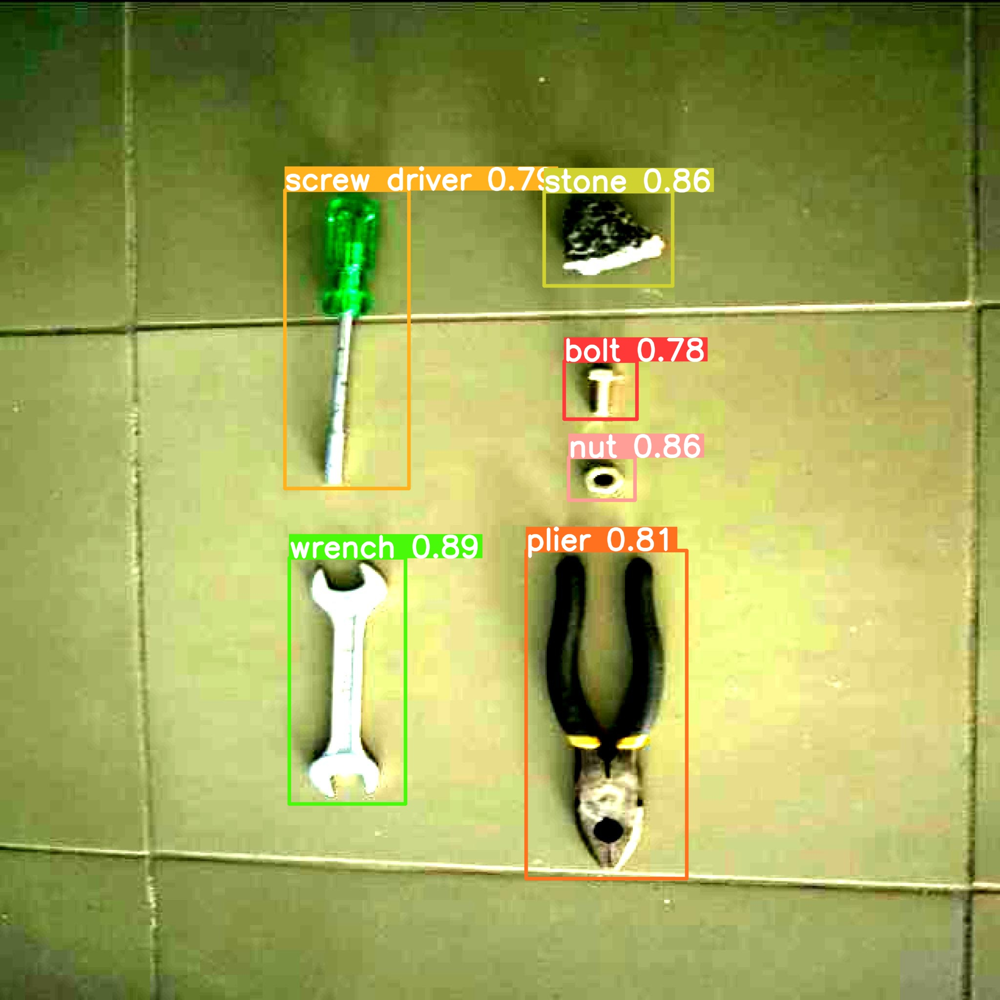

In [43]:
IPython.display.display(IPython.display.Image(filename="./runs/detect/train43/DSC01174_JPG_jpg.rf.e4c6b19c3189b8cee1570417248b0045.jpg"))